# CS470 Introduction to Artificial Intelligent
## Deep Learning Practice
#### Prof. Ho-Jin Choi
#### School of Computing, KAIST


## 3. Convolutional Neural Network
#### Contents
- Why transfer learning?
- Case studies
- Feature extraction using the pre-trained models
- Fine-tuning

---

### 3-4. Why transfer learning?

Constructing and training your own convolutional neural network models from scratch can be hard and a long task. A common trick used in deep learning is to use a **pre-trained** model and **fine-tune** it to the specific data it will be used for.

Today, we are going to discuss about **transfer learning**.  

Basic idea of the **transfer learning** is that we want to transfer weights from the models trained on the other dataset.  
As we learn at the first CNN part, CNN model is typically divided to feature extractor and classification part. Classification layer is task-specific and depends on output. So, we can't transfer weights from classification layer. However, the feature extractor trained on large scale dataset can extract general features from given input, and it can be reused to extract features from another dataset.  
Therefore, we call feature extractor as general layers, and the weights of the feature extractor can be transferred to another model.  

![FineTune](https://github.com/keai-kaist/CS470/blob/main/Lab2/May%206/images/fine-tune.png?raw=true)

Also, we can divide transfer learning to **feature extraction** and **fine-tuning**.  

In the case of **feature extraction**, we freeze the general layers, and only train fully-connected layers on the top of the model for our task.  
However, **fine-tuning** unfreezes every layers and train all of them. Typically, we use very small learning rate to prevent existing parameters from overwritten. 

If we have small dataset, there is a high possibility of overfitting. In this case, using transfer learning can prevent overfitting because knowledge can be trasferred without the need to train it from scratch.

### 3-5. Case studies

To use the pre-trained models for our task, we will first look into several well-known CNN models. Many CNN models have been studied since the 1990s. Especially, since 2010, more advanced models have been developed  through a [ImageNet: Large scale visual recognition challenge (ILSVRC)](http://www.image-net.org/challenges/LSVRC/) in the computer vision fields such as image recognition, object detection, etc.

- LeNet 
- AlexNet
- VGG 
- MobileNet
- Inception (GoogLeNet)
- ResNet50 
- Xception
- ... more to come

![ImageNetWinners](https://github.com/keai-kaist/CS470/blob/main/Lab2/May%206/images/imagenet-winners.png?raw=true)

#### LeNet (Y. LeCun et al., 1989)

![LeNet](https://github.com/keai-kaist/CS470/blob/main/Lab2/May%206/images/lenet.png?raw=true)
Paper: http://yann.lecun.com/exdb/publis/pdf/lecun-01a.pdf

- Yann LeCun et al. proposed a neural network architecture for handwritten and machine-printed character recognition in 1990s.
- The first successful applications of CNN.
- This model consists of 3 convolution layers, 2 pooling layers and 1 fully-connected layer.

#### AlexNet (Krizhevsky, A. et al., 2012)

![AlexNet](https://github.com/keai-kaist/CS470/blob/main/Lab2/May%206/images/alexnet.png?raw=true)
Paper: https://papers.nips.cc/paper/2012/file/c399862d3b9d6b76c8436e924a68c45b-Paper.pdf

- The first work that popularized convolutional neural networks in computer vision.
- This was submitted to the ImageNet ILSVRC challenge in 2012. 
- This network had a very similar architecture to LeNet, but was deeper, bigger, and featured convolutional layers stacked on top of each other.
- This model utilizes GPU, and trained using two GPUs for a week.

#### VGG (Simonyan, K. et al., 2014)
##### VGG-16, VGG-19
![VGG](https://github.com/keai-kaist/CS470/blob/main/Lab2/May%206/images/vgg.png?raw=true)

Paper: https://arxiv.org/pdf/1409.1556.pdf

- The runner-up in ILSVRC 2014 (VGG16)
- Its main contribution was in showing that the depth of the network is a critical component for good performance.
- If model has deeper layers, it is possible to have more non-linearities, which results in better performance.

#### Inception(v3) (GoogLeNet) (Szegedy, C. et al., 2014)

![GoogLeNet](https://github.com/keai-kaist/CS470/blob/main/Lab2/May%206/images/googlenet.png?raw=true)

![InceptionModule](https://github.com/keai-kaist/CS470/blob/main/Lab2/May%206/images/inception-module.png?raw=true)
Paper: https://arxiv.org/abs/1409.4842

- The winner in ILSVRC 2014
- Its main contribution was the development of an `Inception Module` that dramatically reduced the number of parameters in the network. #12 times less than alexnet
- There are also several follow-up versions to the GoogLeNet, most recently Inception-v4.

#### ResNet (He, K. et al., 2015)

![ResNet](https://github.com/keai-kaist/CS470/blob/main/Lab2/May%206/images/resnet.png?raw=true)

![ResidualConnection](https://github.com/keai-kaist/CS470/blob/main/Lab2/May%206/images/residual-connection.png?raw=true)
Paper: https://arxiv.org/pdf/1512.03385.pdf

- The winner in ILSVRC 2015
- It features special skip connections and a heavy use of batch normalization.
- The skip connection (or residual connection) enables each block to additionally learn small information, that reduce the amount of information each layer needs to learn.
- The architecture is also missing fully connected layers at the end of the network. 

### 3-6. Image classification using the pre-trained models

#### VGG16
We can use the pre-trained CNN models mentioned above using the Keras API [tf.keras.applications](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/keras/applications). (More models are available in Keras which can be found here: https://github.com/keras-team/keras-applications)

In [1]:
try:
    %tensorflow_version 2.x
except Exception:
    pass
import tensorflow as tf

import os
import numpy as np
from PIL import Image

We can easily download and load the pre-trained VGG16 model using `tf.keras.applications.VGG16`.

In [8]:
# TODO: Download and load the pre-trained VGG16 model
vgg16 = tf.keras.applications.VGG16(include_top=True, weights='imagenet') 
# include_top: whether to include the 3 fully-connected layers at the top of the network
vgg16.summary()

553467904/553467096 [==============================] - 4s 0us/step
Model: "vgg16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
____________________________________________________________

Then, let's download a strawberry image to classify it using the pre-trained model we just have loaded.

--2021-05-13 06:10:41--  https://upload.wikimedia.org/wikipedia/commons/c/ce/Bowl_of_Strawberries.jpg
Resolving upload.wikimedia.org (upload.wikimedia.org)... 198.35.26.112, 2620:0:863:ed1a::2:b
Connecting to upload.wikimedia.org (upload.wikimedia.org)|198.35.26.112|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 3305846 (3.2M) [image/jpeg]
Saving to: ‘strawberry.jpg’

strawberry.jpg      100%[===================>]   3.15M  17.5MB/s    in 0.2s    

2021-05-13 06:10:41 (17.5 MB/s) - ‘strawberry.jpg’ saved [3305846/3305846]



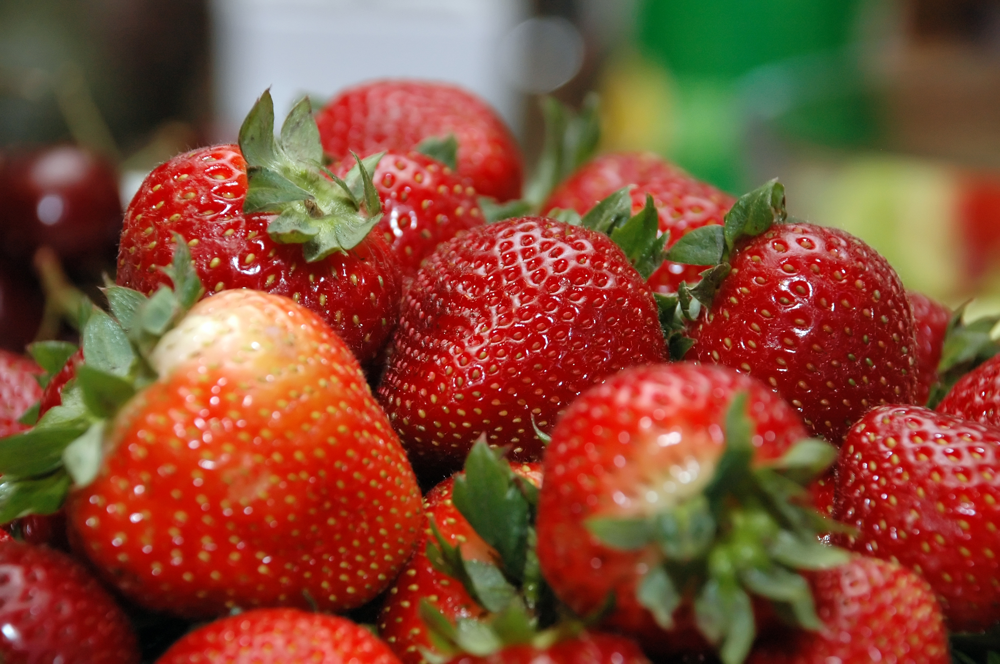

In [9]:
!wget --output-document="strawberry.jpg" https://upload.wikimedia.org/wikipedia/commons/c/ce/Bowl_of_Strawberries.jpg
Image.open('strawberry.jpg')

To feed an image to the pre-trained model, we first have to apply preprocesses that the model used.

In [11]:
# TODO: Load and preprocess the downloaded image
image = tf.keras.preprocessing.image.load_img('strawberry.jpg', target_size=(224,224)) #because of VGG input
x = tf.keras.preprocessing.image.img_to_array(image) # convert image to numpy array
x = np.expand_dims(x, axis=0) # because first input to VGG is [(None, 224, 224, 3)] 
x = tf.keras.applications.vgg16.preprocess_input(x)

print('Input image shape:', x.shape)

Input image shape: (1, 224, 224, 3)


Now, we can feed the input image to the pre-trained model and get prediction results.

In [13]:
# TODO: Predict the image using VGG16
predictions = vgg16(x)
predictions = tf.keras.applications.vgg16.decode_predictions(predictions.numpy())[0]

print(f'Top-{len(predictions)} predictions:')
for index, prediction in enumerate(predictions):
    print(f'{index + 1}. {prediction}')

40960/35363 [==================================] - 0s 0us/step
Top-5 predictions:
1. ('n07745940', 'strawberry', 0.99816823)
2. ('n04332243', 'strainer', 0.0004819409)
3. ('n07613480', 'trifle', 0.00044932368)
4. ('n07753275', 'pineapple', 0.00019187861)
5. ('n04476259', 'tray', 0.00015664664)


As shonw in the prediction results, the VGG16 model predicted a class of the input as a _'strawberry'_ with highest confidence value (or probability), 0.9982.

Let's try to predict again with another image. 

--2021-05-13 06:17:05--  https://upload.wikimedia.org/wikipedia/commons/c/c4/Orange-Fruit-Pieces.jpg
Resolving upload.wikimedia.org (upload.wikimedia.org)... 198.35.26.112, 2620:0:863:ed1a::2:b
Connecting to upload.wikimedia.org (upload.wikimedia.org)|198.35.26.112|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 3389509 (3.2M) [image/jpeg]
Saving to: ‘orange.jpg’

orange.jpg          100%[===================>]   3.23M  17.6MB/s    in 0.2s    

2021-05-13 06:17:05 (17.6 MB/s) - ‘orange.jpg’ saved [3389509/3389509]



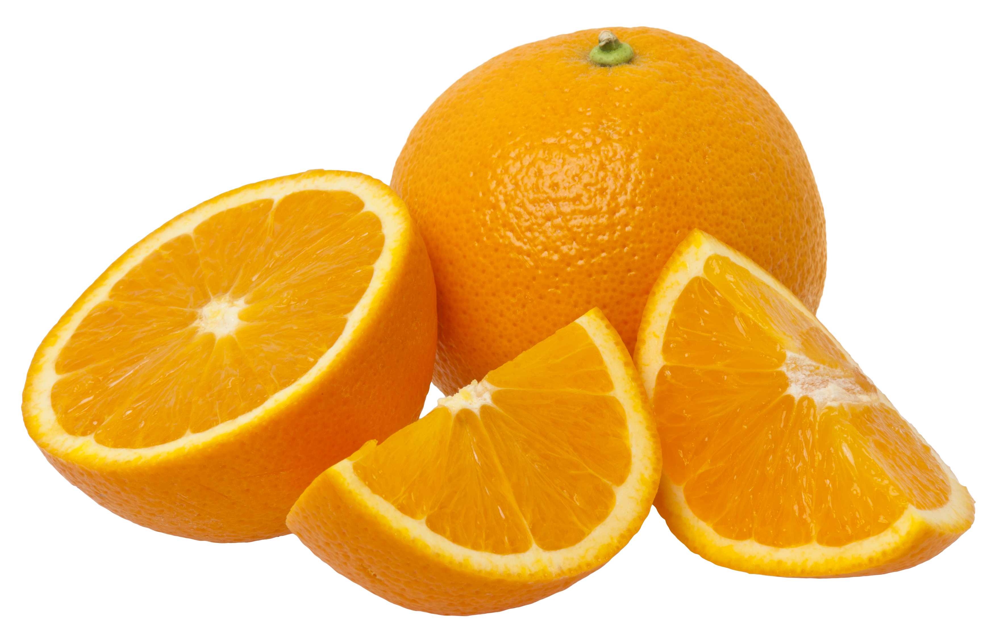

In [14]:
!wget --output-document="orange.jpg" https://upload.wikimedia.org/wikipedia/commons/c/c4/Orange-Fruit-Pieces.jpg
Image.open('orange.jpg')

In [15]:
# TODO: Load and preprocess the downloaded image
image = tf.keras.preprocessing.image.load_img('orange.jpg', target_size=(224,224)) #because of VGG input
x = tf.keras.preprocessing.image.img_to_array(image) # convert image to numpy array
x = np.expand_dims(x, axis=0) # because first input to VGG is [(None, 224, 224, 3)] 
x = tf.keras.applications.vgg16.preprocess_input(x)

print('Input image shape:', x.shape)

Input image shape: (1, 224, 224, 3)


In [16]:
# TODO: Predict the image using VGG16
predictions = vgg16(x)
predictions = tf.keras.applications.vgg16.decode_predictions(predictions.numpy())[0]

print(f'Top-{len(predictions)} predictions:')
for index, prediction in enumerate(predictions):
    print(f'{index + 1}. {prediction}')

Top-5 predictions:
1. ('n07747607', 'orange', 0.9843636)
2. ('n07749582', 'lemon', 0.01533617)
3. ('n07717556', 'butternut_squash', 0.00017809006)
4. ('n03530642', 'honeycomb', 7.011514e-05)
5. ('n07615774', 'ice_lolly', 1.20654195e-05)


#### ResNet50
Similar to VGG16 model, we can use RestNet50 using the Keras API. ResNet50 is so big compared to the VGG16. Let's check it out.

In [20]:
# TODO: Download and load the pre-trained ResNet50 model
resnet50 = tf.keras.applications.ResNet50(include_top=True, weights='imagenet')
resnet50.summary()

102973440/102967424 [==============================] - 1s 0us/step
Model: "resnet50"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
conv1_pad (ZeroPadding2D)       (None, 230, 230, 3)  0           input_2[0][0]                    
__________________________________________________________________________________________________
conv1_conv (Conv2D)             (None, 112, 112, 64) 9472        conv1_pad[0][0]                  
__________________________________________________________________________________________________
conv1_bn (BatchNormalization)   (None, 112, 112, 64) 256         conv1_conv[0][0]                 
________________________

In [23]:
# TODO: Predict the images using ResNet50

for image_filename in ('strawberry.jpg','orange.jpg'):
  image = tf.keras.preprocessing.image.load_img(image_filename, target_size=(224,224)) # because first input is [(None, 224, 224, 3)] 
  x = tf.keras.preprocessing.image.img_to_array(image) # convert image to numpy array
  x = np.expand_dims(x, axis=0) 
  x = tf.keras.applications.resnet50.preprocess_input(x)

  predictions = resnet50(x)
  predictions = tf.keras.applications.resnet50.decode_predictions(predictions.numpy())[0]

  print(f'Top-{len(predictions)} predictions: of {image_filename}')
  for index, prediction in enumerate(predictions):
      print(f'{index + 1}. {prediction}')

print('Input image shape:', x.shape)

#(None, 7, 7, 2048)

Top-5 predictions: of strawberry.jpg
1. ('n07745940', 'strawberry', 0.99813783)
2. ('n07753275', 'pineapple', 0.00042887527)
3. ('n07613480', 'trifle', 0.0003494208)
4. ('n04332243', 'strainer', 0.0001924405)
5. ('n07753592', 'banana', 0.00016354266)
Top-5 predictions: of orange.jpg
1. ('n07747607', 'orange', 0.9760335)
2. ('n07749582', 'lemon', 0.023964383)
3. ('n07754684', 'jackfruit', 8.779028e-07)
4. ('n07753592', 'banana', 4.026683e-07)
5. ('n03530642', 'honeycomb', 2.3151539e-07)
Input image shape: (1, 224, 224, 3)


### References 
- [Very Deep Convolutional Networks for Large-Scale Image Recognition](https://arxiv.org/abs/1409.1556) - please cite this paper if you use the VGG models in your work.
- [Deep Residual Learning for Image Recognition](https://arxiv.org/abs/1512.03385) - please cite this paper if you use the ResNet model in your work.
- [Rethinking the Inception Architecture for Computer Vision](http://arxiv.org/abs/1512.00567) - please cite this paper if you use the Inception v3 model in your work.